### Advanced Lane Finding

In this notebook, the below objectives are met using a computer vision model to identify lane lines from road images.

1. Camera calibration
2. Color thresholding
3. Perspective transform
4. Lane Curvature Calculation
5. Draw highlights lane lines to image

### Import necesasry libraries

In [1]:
import numpy as np
import cv2
import glob
import os

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import matplotlib

from functools import partial

from moviepy.editor import VideoFileClip

%matplotlib inline

### Import Objects from advanced_lane_lines

In [2]:
from advanced_lane_lines import CameraCalibration
from advanced_lane_lines import ColorThresholds
from advanced_lane_lines import PerspectiveTransform
from advanced_lane_lines import LaneCurvature
import advanced_lane_lines

### Debug Option

If you would like to see logs, turn DEBUG_FLAG to True.

If you would to store new images, turn STORE_FLAG to True.

In [3]:
# header
DEBUG_FLAG = False
STORE_FLAG = True

### Helper Functions

In [4]:
# Helper function to plot images
def plot_imgs(img1, title1, img2, title2, rgb=False):
    plt.figure(figsize=(11,6))
    plt.subplot(1,2,1)
    plt.title(title1)
    # if rgb:
        # plt.imshow(cv2.cvtColor(img1,cv2.COLOR_RGB2BGR))
    # else:
    plt.imshow(img1)
    
    plt.subplot(1, 2, 2)
    plt.title(title2)
    # if rgb:
        # plt.imshow(cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))
    # else:
    plt.imshow(img2)
    
    plt.show()


# Store image
def store_image(filename, filepath, img, color=True):
    '''
    stores image as file name to file path
    '''
    # create plt figure
    fig = plt.figure()
    # create output file path
    output_filepath = os.path.join(filepath, filename) + ".png"
    
    # make sure the directory exists before writing to file
    os.makedirs(os.path.dirname(output_filepath), exist_ok=True)
    
    # write to file
    # cv2.imwrite(output_filepath, cv2.cvtColor(img, cv2.COLOR_HLS2RGB))
    if color:
        cv2.imwrite(output_filepath, cv2.cvtColor(img,cv2.COLOR_RGB2BGR))
    else:
        cv2.imwrite(output_filepath, img)
        print("written")
        
    if DEBUG_FLAG:
        print("/helper_functions.py/store_image/: set " + output_filepath)

### Test functions

We first define the header variables needed below.

In [5]:
# camerea calibration headers
CAMERA_CALIBRATION_DATA = "../camera_cal/calibration.p"
CAMERA_CALIBRATION_IMAGES = "../camera_cal/calibration*.jpg"
X_CORNERS = 9
Y_CORNERS = 6


# color threshold headers
gray_threshold = (35, 255)
s_color_threshold = (170, 255)
l_color_threshold = (30, 255)
min_neighbor = 4
kernel_size = 3

# perspective transform headers
temp_img = mpimg.imread("../output_images/Undistort/undistort_lines_0.png")
left_bottom_corner = [250, 700] # [255, 697] # [250, 700]
left_top_corner = [580, 450] # [585, 456] # [580, 450]
right_top_corner = [700, 450] # [700, 456] # [700, 450]
right_bottom_corner = [1060, 690] # [1061, 690] # [1060, 690]

corners = np.float32([left_bottom_corner, left_top_corner,
                      right_top_corner, right_bottom_corner])

new_top_left = np.array([corners[0,0], 0])
new_top_right = np.array([corners[3,0], 0])
offset = [50, 0]

temp_img_size = (temp_img.shape[1], temp_img.shape[0])
src = np.float32([corners[0], corners[1], corners[2], corners[3]])
dst = np.float32([corners[0] + offset, new_top_left + offset,
                  new_top_right - offset, corners[3] - offset])
print("source points...")
print(src)
print("destination points...")
print(dst)
# Lane curvature headers
nwindows = 9
margin = 75
min_num_pixels = 35
max_buffer_size = 12
buffer_matrix_size = 720
txt_color = (255, 0, 0)
lane_txt_posit = (100,50)
deviat_txt_posit = (100, 90)

# file output headers
FP_OUTPUT = {"undistort" : "../output_images/Undistort/",
             "binarize" : "../output_images/ColorBinary/",
             "perspective" : "../output_images/Perspective/",
             "curvature" : "../output_images/LaneCurvature/"}

source points...
[[  250.   700.]
 [  580.   450.]
 [  700.   450.]
 [ 1060.   690.]]
destination points...
[[  300.   700.]
 [  300.     0.]
 [ 1010.     0.]
 [ 1010.   690.]]


We then define the objects that we're testing.

In [6]:
# Camera Calibration object
calibration = CameraCalibration(CAMERA_CALIBRATION_IMAGES,
                                CAMERA_CALIBRATION_DATA,
                                X_CORNERS, Y_CORNERS,
                                debug_flag=DEBUG_FLAG)
# Color threshold object
colorThreshold = ColorThresholds(gray_threshold,
                                 s_color_threshold,
                                 l_color_threshold,
                                 min_neighbor, 
                                 kernel_size)

# Perspective Transform object
perspective = PerspectiveTransform(src, dst)

# Lane Curvature Object
lane_curvature = LaneCurvature(calibration, colorThreshold, perspective,
                               max_buffer_size, buffer_matrix_size,
                               nwindows, margin, min_num_pixels,
                               txt_color, lane_txt_posit, deviat_txt_posit)

I created a simple test function that we're using.

In [7]:
# Helper test function that determines function call
def test_function(pname, img):
    process = {
        "undistort" : partial(calibration.undistort, img),
        "binarize" : partial(colorThreshold.convertBinary, img),
        "perspective" : partial(perspective.transform, img),
        "curvature" : partial(lane_curvature.process, img)
    }
    func = process.get(pname)
    return func()

# Help function to test procedures
def test_advanced_lane_lines(pname, fp, batch_name, output_name,
                             rgb=False, store=False):
    for idx, fname in enumerate(glob.glob(fp)):
        original_img = mpimg.imread(fname)
        
        output_img = test_function(pname, original_img)

        plot_imgs(original_img, "Original Image" + str(idx),
                  output_img, pname + str(idx), rgb)
        if store:
            store_image(output_name + "_"+ str(idx), FP_OUTPUT[pname], 
                        output_img)

### 1. Camera Calibration

Camera calibration is written in the CameraCalibration class in advanced_line_lines.py. 

This class handles camera calibration. The class's constructor takes the following arguments:
1. Filepath to camera images used for camera calibration.
2. Filepath to camera calibration data stored in pickle format.
3. A number of corners in the x-axis.
4. A number of corners in the y-axis.
5. Debug flag

I highlighted the following methods in this class:
1. undistort:takes a filepath to an undistorted image as input and returns an undistroted image.

We will test method undistort on chessboard images.

The images are stored in "../output_images/Undistort".

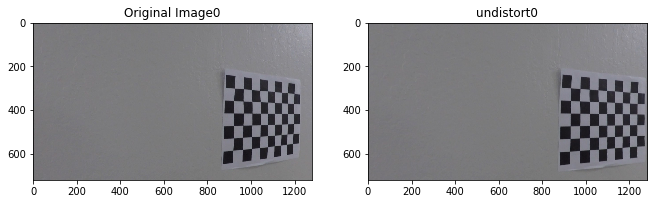

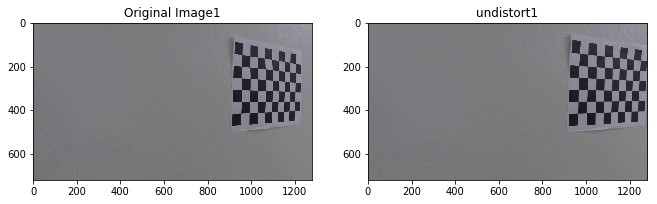

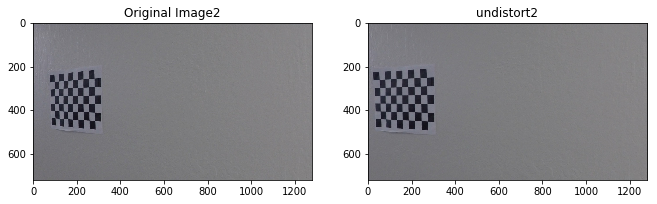

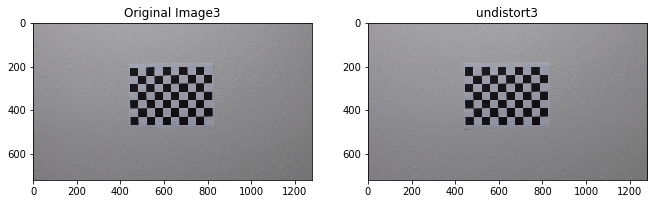

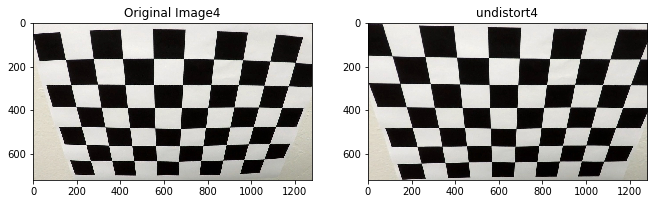

...

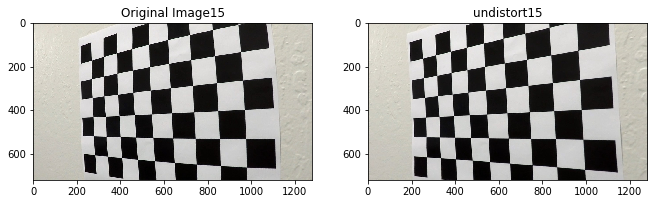

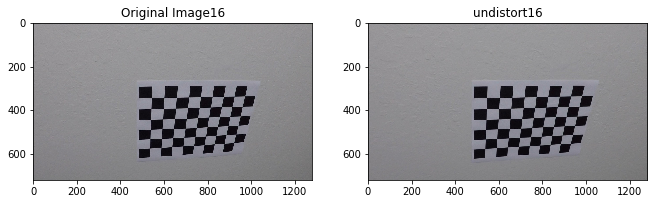

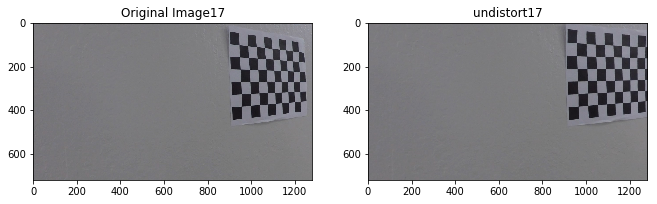

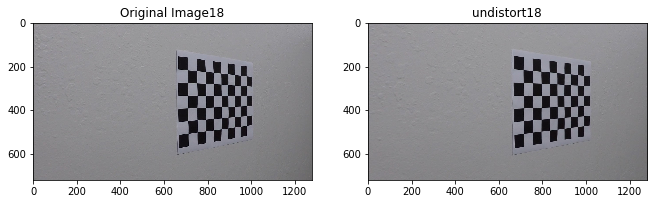

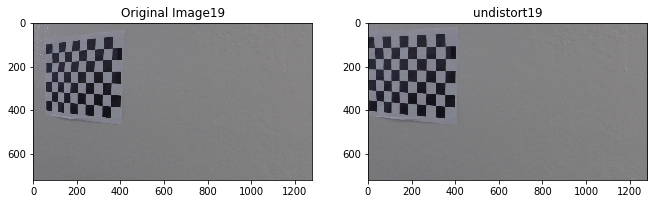

In [8]:
# test chessboard distortion correction
test_advanced_lane_lines("undistort", CAMERA_CALIBRATION_IMAGES, 
                         "chessboard", "undistort_chessboard", 
                         rgb=False, store=STORE_FLAG)

We will now undistort test images that show lane lines.

Similarly, the images are stored in "../output_images/Undistort".

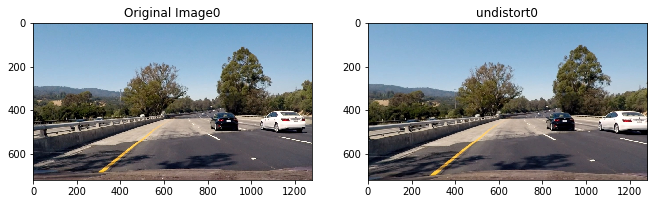

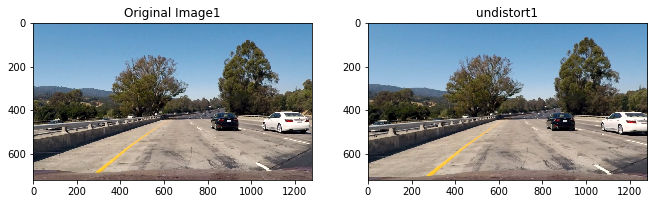

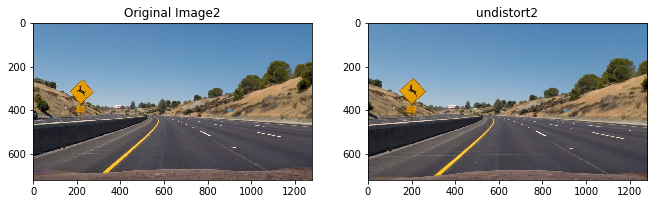

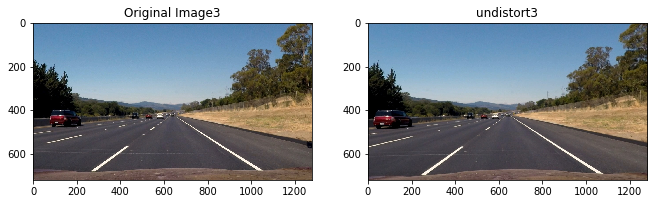

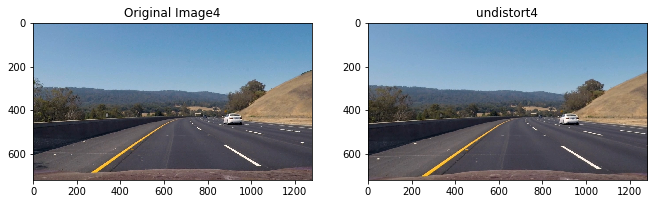

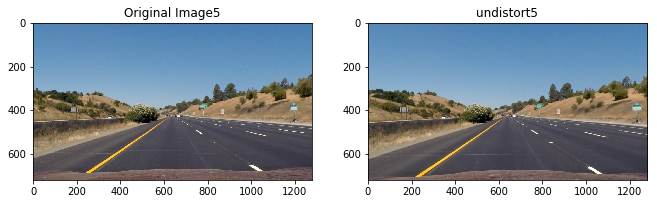

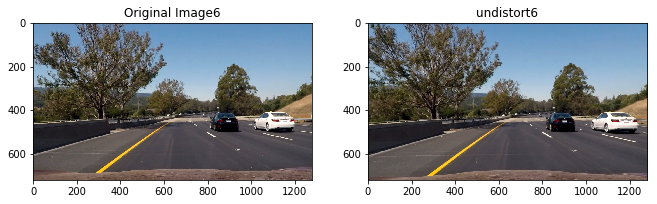

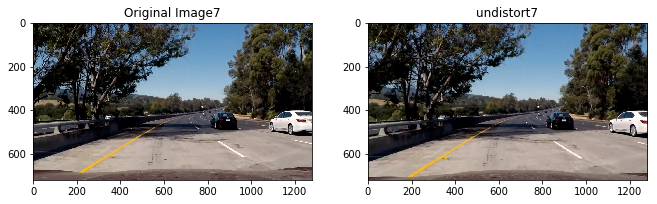

In [9]:
# headers
TEST_IMAGES = '../test_images/*.jpg'

# test distortion correct on lane lines
test_advanced_lane_lines("undistort", TEST_IMAGES,
                         "test_images", "undistort_lines",
                         rgb=True, store=STORE_FLAG)

### 2. Color Thresholding

To identify lane lines, I apply three techniques below:
1. Sobel operation
2. Color thresholding in S component of HLS color space.
3. Color thresholding in L component of HLS color space.

These three methods are defined in the class below.

Color Thresholding is written in the Colorthreshold class in advanced_line_lines.py.

This class handles color thresholding. The class's constructor takes the following arguments:

1. Tuple with minimum and maximum gray color thresholds.
2. Tuple with minimum and maximum S color threshold in HSL color.
3. Tuple with minimum and maximum L color threshold in HLS color.
4. Minimum number of neighbors with value.
5. Size of the kernel size by Sobel operation.
6. Debug flag

I highlighted the following methods in this class:

convertBinary: creates a binary image where lines are marked in white color and rest of the image is marked in black color.

The images are stored in "../output_images/ColorBinary/".

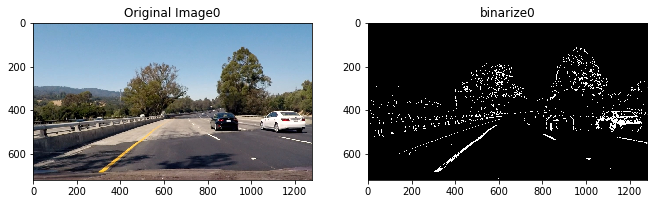

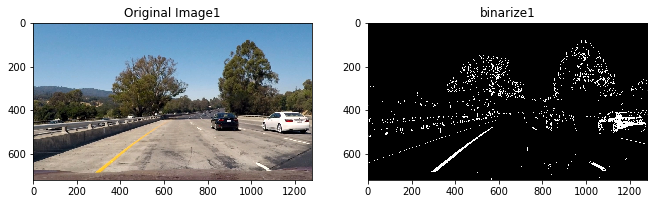

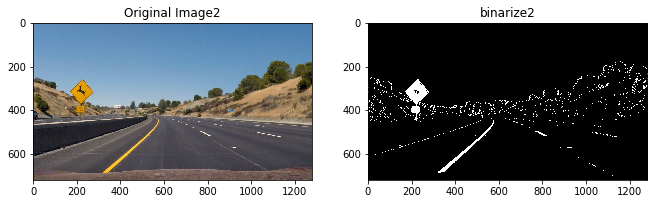

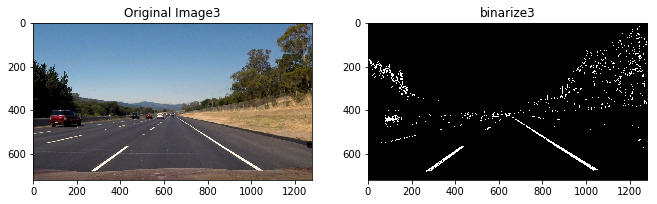

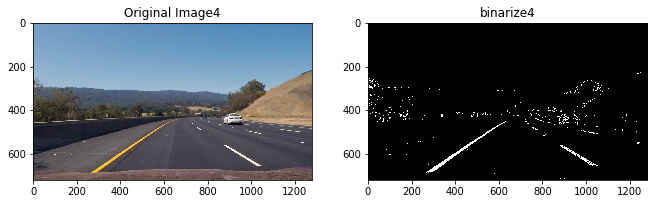

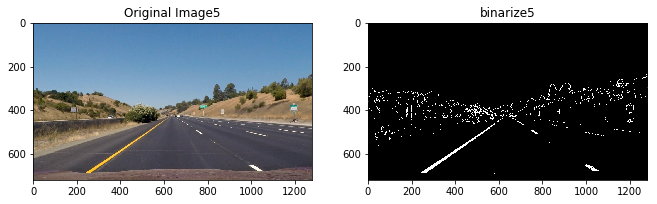

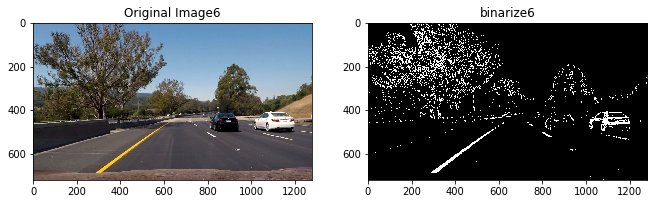

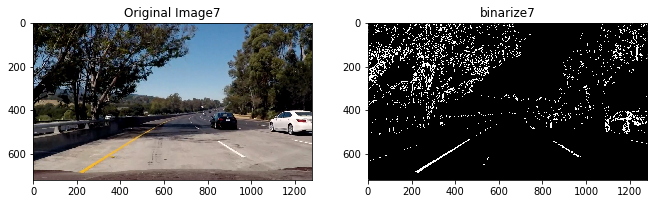

In [10]:
# test color threshing on lane lines
test_advanced_lane_lines("binarize", TEST_IMAGES,
                         "test_images", "color_lines",
                         rgb=True, store=STORE_FLAG)

## 3. Perspective Transformation

A perspective transform maps the points in a given image to user specified points that creates a new perspective.

This project uses the bird-eye's view transform to able to view a lane from above.

Perspective Transform is written in the PerspectiveTranform class in advanced_line_lines.py.

This class handles perspective transformation. The class's constructor takes the following arguments:

1. List of original source points of image.

2. List of new destination source points of image.

3. Debug flag

I highlighted the following methods in this class:

1. transform: takes orignal image to perform matrix transformation.

2. transform_inverse: takes orignal image to perform inverse matrix transformation

The images are stored in "../output_images/Perspective/".

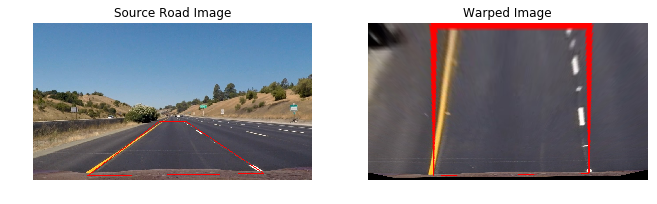

In [11]:
pt_test_img = mpimg.imread("../test_images/straight_lines1.jpg")

cv2.line(pt_test_img, tuple(left_bottom_corner), tuple(left_top_corner),
         color=txt_color, thickness=2)
cv2.line(pt_test_img, tuple(left_top_corner), tuple(right_top_corner),
         color=txt_color, thickness=2)
cv2.line(pt_test_img, tuple(right_top_corner), tuple(right_bottom_corner),
         color=txt_color, thickness=2)
cv2.line(pt_test_img, tuple(right_bottom_corner), tuple(left_bottom_corner),
         color=txt_color, thickness=2)

warped_img = perspective.transform(pt_test_img)

plt.figure(figsize=(11, 5))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.title('Source Road Image')
plt.imshow(pt_test_img)


plt.subplot(1, 2, 2)
plt.axis('off')
plt.title('Warped Image')
plt.imshow(warped_img)

plt.show()

store_image("test_case_source", FP_OUTPUT["perspective"], pt_test_img)
store_image("test_case_warped", FP_OUTPUT["perspective"], warped_img)

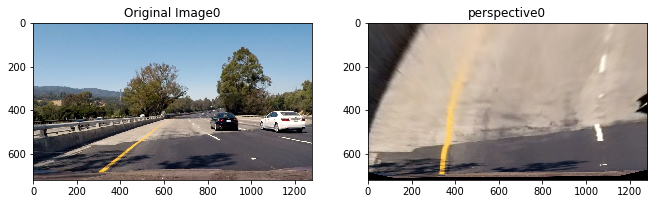

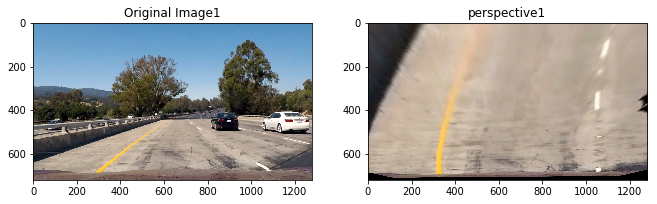

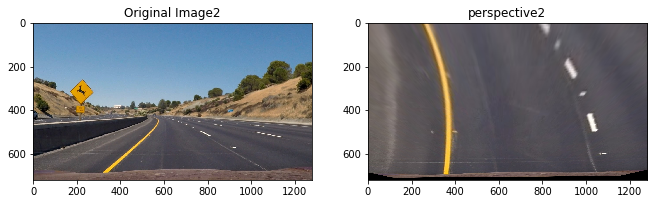

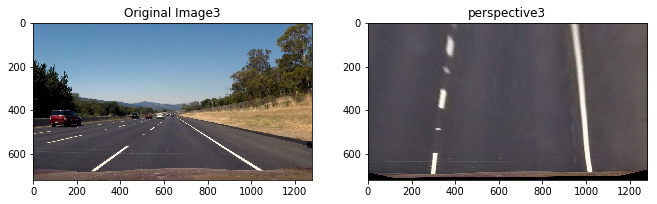

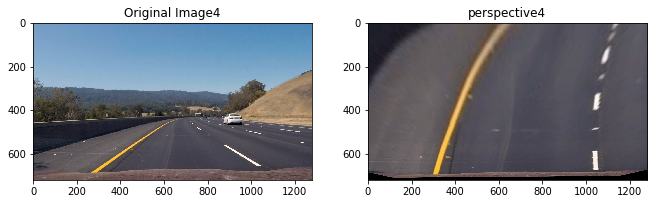

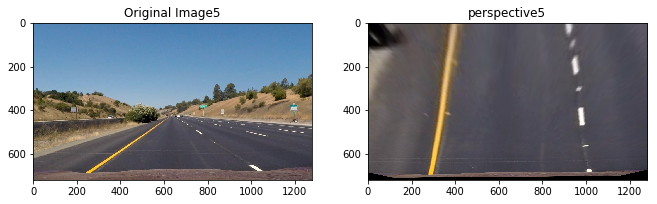

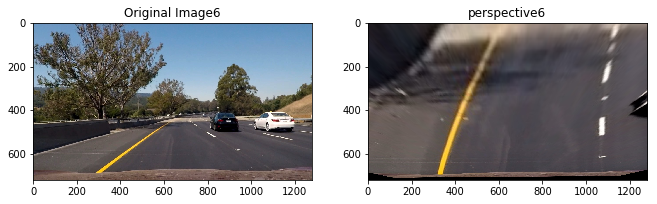

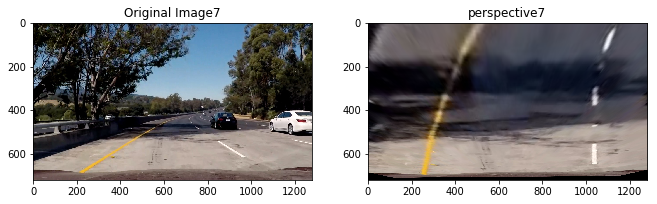

In [12]:
# test perspective transform on lane lines
test_advanced_lane_lines("perspective", TEST_IMAGES,
                         "test_images", "perspective",
                         rgb=True, store=STORE_FLAG)

When we combine color thresholding and perspective transformation, we get the following results.

The results are stored in "../output_images/ColorBinary/".

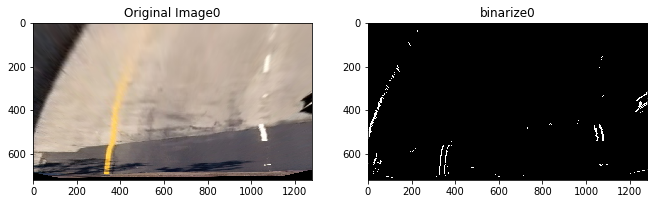

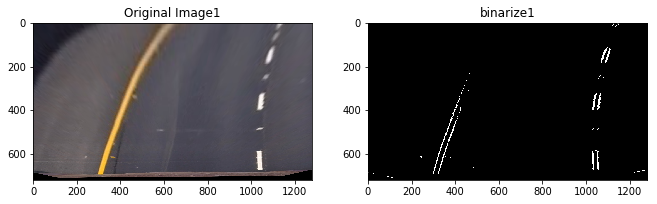

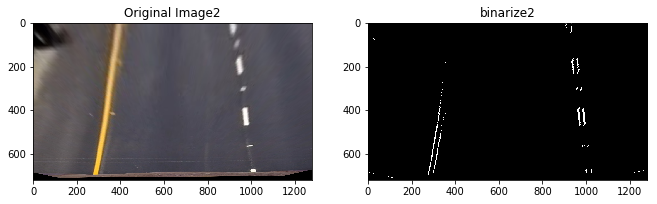

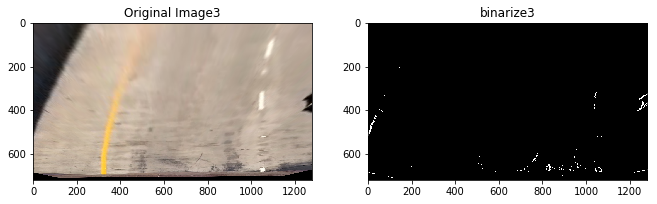

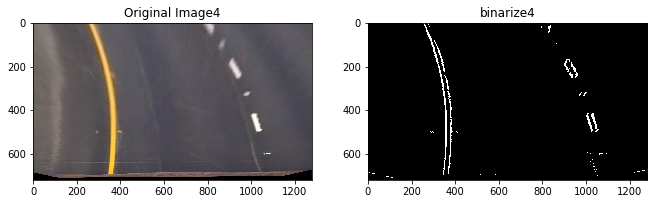

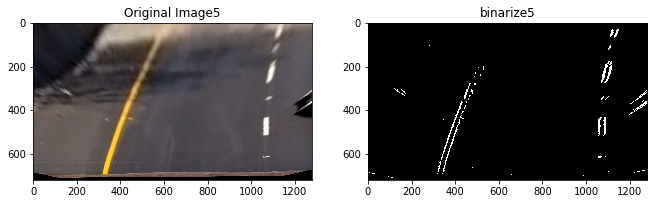

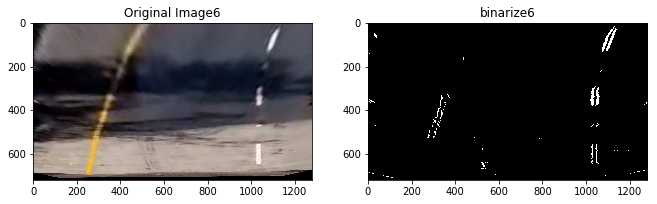

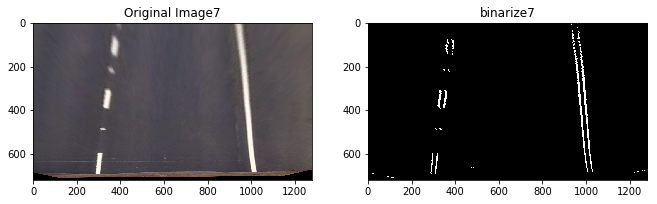

In [13]:
TEST_IMAGES2 = FP_OUTPUT["perspective"]+"perspective_*.png"
# test perspective transform and color thresholding on lane lines
test_advanced_lane_lines("binarize", TEST_IMAGES2,
                         "test_images", "perspective_and_binarize",
                         rgb=True, store=STORE_FLAG)

### 4. Lane Curvature
Lane Curvature calculation is written in the LaneCurvature class in advanced_line_lines.py.

This class handles lane curvature. The class's constructor does not take any arguments.

I highlighted the following methods in this class:

1. \_lane_detect_init: 
    * takes a binary image and produces X coordinates of left and right lane lines.
    * uses sliding window to identify lane lines from the binary image and then uses a second order polynomial estimation technique to calculate road curvature.
2. \_lane_detect_next:
    * once we have identified lane lines, we use the lane lines found in the previous image rather than searching the entire image.
The images are stored in "../output_images/LaneCurvature/".

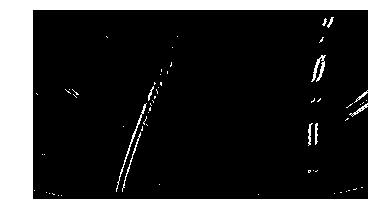

In [21]:
TEST_IMAGE3=FP_OUTPUT["binarize"]+"perspective_and_binarize_5.png"
warped_image = mpimg.imread(TEST_IMAGE3)
plt.imshow(warped_image)
plt.axis('off')
plt.show()

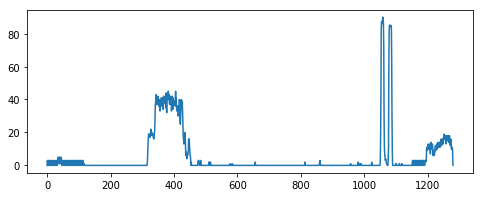

written


In [15]:
histogram = np.sum(warped_image[warped_image.shape[0] // 2:, :, 0], axis=0)
plt.figure(figsize=(8, 3))
plt.plot(histogram)
plt.show()

store_image("test_case_histogram", FP_OUTPUT["curvature"],
            histogram, color=False)

In [16]:
midpoint = np.int(histogram.shape[0] / 2)

# get left and right halves of the histogram
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

print('Peak point of left half: {}'.format(leftx_base))
print('Peak point of right half: {}'.format(rightx_base))

Peak point of left half: 382
Peak point of right half: 1058


In [18]:
nwindows = 9
window_height = np.int(warped_image.shape[0] / nwindows)

# Extracts x and y coordinates of non-zero pixels
nonzero = warped_image.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

# Set current x coordinated for left and right
leftx_current = leftx_base
rightx_current = rightx_base

margin = 75
min_num_pixels = 35

# save pixel ids in these two lists
left_lane_inds = []
right_lane_inds = []

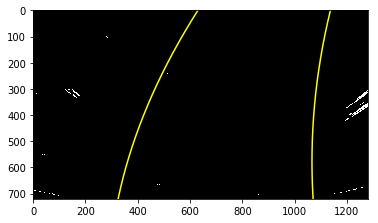

In [19]:
for window in range(nwindows):
    win_y_low = warped_image.shape[0] - (window + 1) * window_height
    win_y_high = warped_image.shape[0] - window * window_height

    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin

    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                      (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                       (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)

    if len(good_left_inds) > min_num_pixels:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > min_num_pixels:
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the ndarrays of indices
left_lane_array = np.concatenate(left_lane_inds)
right_lane_array = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_array]
lefty = nonzeroy[left_lane_array]
rightx = nonzerox[right_lane_array]
righty = nonzeroy[right_lane_array]

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

fity = np.linspace(0, warped_image.shape[0] - 1, warped_image.shape[0])
fit_leftx = left_fit[0] * fity ** 2 + left_fit[1] * fity + left_fit[2]
fit_rightx = right_fit[0] * fity ** 2 + right_fit[1] * fity + right_fit[2]


warped_image[nonzeroy[left_lane_array], nonzerox[left_lane_array]] = [255, 0, 0]
warped_image[nonzeroy[right_lane_array], nonzerox[right_lane_array]] = [0, 0, 255]
plt.imshow(warped_image)
plt.plot(fit_leftx, fity, color='yellow')
plt.plot(fit_rightx, fity, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.show()

store_image("test_curvature_withline", FP_OUTPUT["curvature"], warped_image)

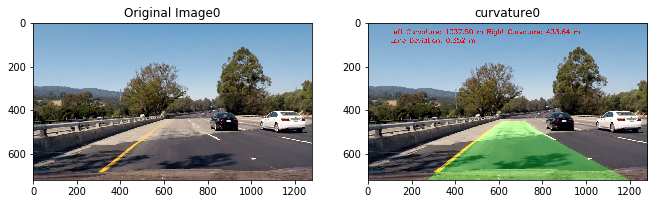

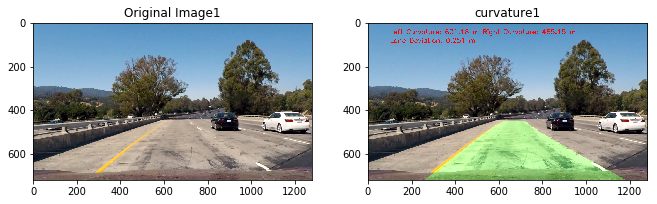

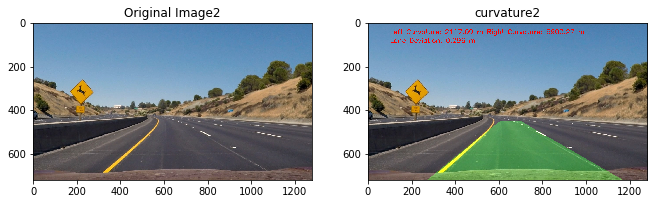

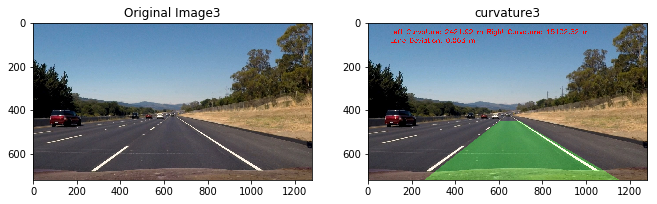

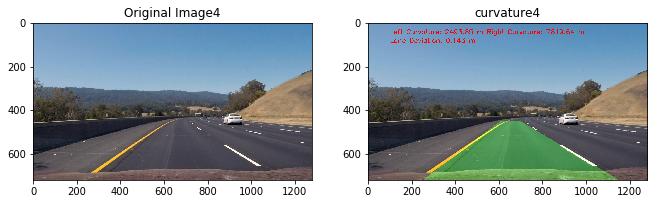

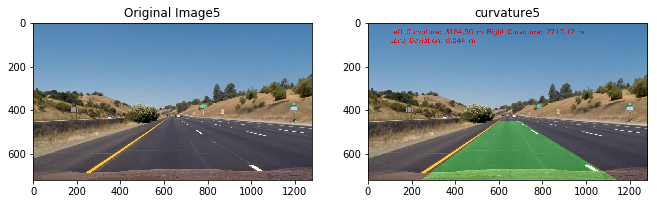

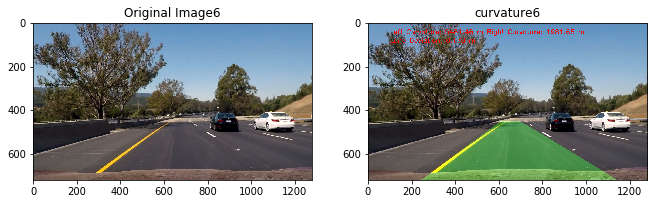

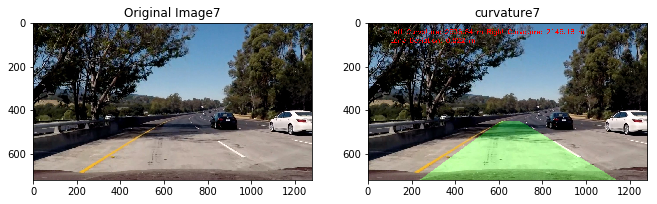

In [22]:
# test perspective transform on lane lines
test_advanced_lane_lines("curvature", TEST_IMAGES,
                         "test_images", "curvature",
                         rgb=True, store=STORE_FLAG)

In [23]:
output_file = '../output_video/processed_project_video.mp4'
input_file = '../project_video.mp4'

clip = VideoFileClip(input_file)
out_clip = clip.fl_image(lane_curvature.process) 
out_clip.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video ../output_video/processed_project_video.mp4
[MoviePy] Writing video ../output_video/processed_project_video.mp4


100%|█████████▉| 1260/1261 [05:36<00:00,  3.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../output_video/processed_project_video.mp4 



In [24]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_file))

In [25]:
challenge_output_file = '../output_video/challenge_processed_project_video.mp4'
challenge_input_file = '../harder_challenge_video.mp4'

clip = VideoFileClip(challenge_input_file)
out_clip = clip.fl_image(lane_curvature.process) 
out_clip.write_videofile(challenge_output_file, audio=False)

[MoviePy] >>>> Building video ../output_video/challenge_processed_project_video.mp4
[MoviePy] Writing video ../output_video/challenge_processed_project_video.mp4


 40%|████      | 485/1200 [02:26<03:46,  3.15it/s]

ValueError: On entry to DLASCL parameter number 4 had an illegal value

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output_file))